Use highly conserved (100%) residues to do regression

In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from joblib import dump
from scipy.stats import pearsonr
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_squared_error, make_scorer
from itertools import combinations
from matplotlib.patches import Rectangle

In [ ]:
import pandas as pd
import os

# File paths
conservation_file = r"conservation_sorted.csv"
alignment_file = r"alignment_segment_with_index.csv"
mustang_folder = r"Results/fitted_matlab_segments/mustang_endsAlignment_cleaned_noOutliers"
pdb_folder = r"Results/activation_segments/Mustang_with_singlechain_withoutlier"

output_file = r"conserved_residues_actual_number.csv"

#Read conservation file and filter for 100% conserved residues
conservation_df = pd.read_csv(conservation_file)
conservation_df['Conservation_Percentage'] = (
    conservation_df['Conservation_Percentage'].str.rstrip('%').astype(float) / 100
)
conserved_df = conservation_df[conservation_df['Conservation_Percentage'] == 1.0]
template_indices_1_0 = conserved_df['Template_Index'].tolist()

#Read alignment file
alignment_df = pd.read_csv(alignment_file)

#Keep only PDBs that exist in mustang_folder
valid_pdb_names = [os.path.splitext(f)[0] for f in os.listdir(mustang_folder) if f.endswith(".pdb")]

#Filter alignment data for conserved template indices and valid PDB names
filtered_alignment = alignment_df[
    (alignment_df['Template_Index'].isin(template_indices_1_0)) &
    (alignment_df['PDB_Name'].isin(valid_pdb_names))
]

# Merge to bring in the conserved residue name (Residue column from conservation_df)
filtered_alignment = filtered_alignment.merge(
    conserved_df[['Template_Index', 'Residue']],
    on='Template_Index',
    how='left'
)

#Map Target_Index to actual residue number in the PDB
results = []

for pdb_name, group in filtered_alignment.groupby('PDB_Name'):
    pdb_file_path = os.path.join(pdb_folder, f"{pdb_name}.pdb")
    if not os.path.exists(pdb_file_path):
        print(f"Warning: PDB file not found: {pdb_file_path}")
        continue

    # Extract unique residue sequence numbers from ATOM lines in PDB
    pdb_residues = []
    with open(pdb_file_path, 'r') as pdb_file:
        for line in pdb_file:
            if line.startswith("ATOM"):
                res_seq = line[22:26].strip()
                if res_seq not in pdb_residues:
                    pdb_residues.append(res_seq)

    for _, row in group.iterrows():
        target_index = int(row['Target_Index']) - 1  
        if 0 <= target_index < len(pdb_residues):
            actual_res_num = pdb_residues[target_index]
        else:
            actual_res_num = "IndexOutOfRange"

        print(f"[{pdb_name}] Template_Index={row['Template_Index']} ({row['Residue']}) | "
              f"Target_Index={row['Target_Index']} -> Actual_Residue_Number={actual_res_num}")

        results.append({
            "PDB_Name": pdb_name,
            "Template_Index": row['Template_Index'],
            "Residue": row['Residue'],  # Add residue name
            "Target_Index": row['Target_Index'],
            "Actual_Residue_Number": actual_res_num
        })

# Save results
results_df = pd.DataFrame(results)
results_df.to_csv(output_file, index=False)
print(f"Saved conserved residues mapping to {output_file}")


[1APM_E] Template_Index=87 (SER-536) | Target_Index=117 -> Actual_Residue_Number=127
[1APM_E] Template_Index=112 (ALA-561) | Target_Index=141 -> Actual_Residue_Number=151
[1APM_E] Template_Index=113 (GLN-562) | Target_Index=142 -> Actual_Residue_Number=152
[1APM_E] Template_Index=114 (GLY-563) | Target_Index=143 -> Actual_Residue_Number=153
[1APM_E] Template_Index=115 (MET-564) | Target_Index=144 -> Actual_Residue_Number=154
[1APM_E] Template_Index=116 (ASP-565) | Target_Index=145 -> Actual_Residue_Number=155
[1APM_E] Template_Index=117 (TYR-566) | Target_Index=146 -> Actual_Residue_Number=156
[1APM_E] Template_Index=119 (HIS-568) | Target_Index=148 -> Actual_Residue_Number=158
[1APM_E] Template_Index=120 (ALA-569) | Target_Index=149 -> Actual_Residue_Number=159
[1APM_E] Template_Index=121 (LYS-570) | Target_Index=150 -> Actual_Residue_Number=160
[1APM_E] Template_Index=124 (ILE-573) | Target_Index=153 -> Actual_Residue_Number=163
[1APM_E] Template_Index=125 (HIS-574) | Target_Index=15

In [ ]:
import pandas as pd
import numpy as np
import os
from itertools import combinations

# Inputs 
conserved_csv = r"conserved_residues_actual_number.csv"
pdb_folder    = r"Results/activation_segments/Mustang_with_singlechain_withoutlier"
out_matrix    = r"pairwise_distance_features.csv"       # wide format (like your 2nd image)
out_mapping   = r"pairwise_distance_feature_map.csv"    # d_i_j -> residue pair label

#helper
def compute_pairwise_distances(coords: np.ndarray) -> np.ndarray:
    """Return all pairwise Euclidean distances for coords of shape (n_res, 3)."""
    dists = []
    for i, j in combinations(range(len(coords)), 2):
        dists.append(np.linalg.norm(coords[i] - coords[j]))
    return np.array(dists, dtype=float)

#read conserved table
df = pd.read_csv(conserved_csv)
df["Actual_Residue_Number"] = df["Actual_Residue_Number"].astype(str)

all_rows = []
columns = None
pair_indices = None
pair_labels  = None
n_res_ref = None

# iterate PDBs
for pdb_name, sub in df.groupby("PDB_Name"):
    # keep a stable order across PDBs
    if "Target_Index" in sub.columns:
        sub = sub.sort_values("Target_Index")

    # labels ONLY use 'Residue' 
    res_labels = sub["Residue"].astype(str).str.strip().tolist()
    conserved_nums = sub["Actual_Residue_Number"].tolist()

    #parse CA coords from PDB
    pdb_path = os.path.join(pdb_folder, f"{pdb_name}.pdb")
    if not os.path.exists(pdb_path):
        print(f"[Skip] PDB not found: {pdb_path}")
        continue

    coords_dict = {}
    with open(pdb_path, "r") as f:
        for line in f:
            if line.startswith("ATOM") and " CA " in line[12:16]:
                res_num = line[22:26].strip()
                if res_num in conserved_nums:
                    x = float(line[30:38]); y = float(line[38:46]); z = float(line[46:54])
                    coords_dict[res_num] = [x, y, z]

    coords = []
    missing = False
    for rn in conserved_nums:
        if rn in coords_dict:
            coords.append(coords_dict[rn])
        else:
            print(f"[Warn] Missing CA for {pdb_name} residue {rn}; skipping this PDB.")
            missing = True
            break
    if missing:
        continue

    coords = np.array(coords, dtype=float)

    #initialize header once, and enforce consistent residue count
    if n_res_ref is None:
        n_res_ref = len(coords)
        pair_indices = list(combinations(range(n_res_ref), 2))
        # header like d_0_1, d_0_2, ...
        d_cols = [f"d_{i}_{j}" for i, j in pair_indices]
        columns = ["PDB_Name"] + d_cols
        # also keep a mapping to readable residue pairs
        pair_labels = [f"{res_labels[i]}__{res_labels[j]}" for i, j in pair_indices]
    else:
        if len(coords) != n_res_ref:
            print(f"[Skip] {pdb_name} has {len(coords)} residues, expected {n_res_ref}.")
            continue

    #distances and append row
    dists = compute_pairwise_distances(coords)
    row = [pdb_name] + dists.tolist()
    all_rows.append(row)

#save wide matrix
if not all_rows:
    raise RuntimeError("No valid PDB rows produced — check inputs.")
df_wide = pd.DataFrame(all_rows, columns=columns)
df_wide.to_csv(out_matrix, index=False)
print(f"[OK] Wide matrix saved to: {out_matrix}")

#save mapping d_i_j -> residue pair label (optional but handy)
map_df = pd.DataFrame({
    "column_name": [f"d_{i}_{j}" for i, j in pair_indices],
    "residue_pair": pair_labels
})
map_df.to_csv(out_mapping, index=False)
print(f"[OK] Feature map saved to: {out_mapping}")


[OK] Wide matrix saved to: pairwise_distance_features.csv
[OK] Feature map saved to: pairwise_distance_feature_map.csv


In [ ]:
def random_forest_predict(
    feature_file: str,
    y_file: str,
    out_prefix: str,
    test_size: float = 0.20,
    random_state: int = 42,
    drop_cols=("Folder",),
    mapping_file: str | None = None, 
):
    # Create output directory like predict/<out_prefix>
    out_dir = os.path.join("predict", out_prefix)
    os.makedirs(out_dir, exist_ok=True)

    # Load feature matrix; optionally drop non-feature columns
    feats = pd.read_csv(feature_file)
    for c in drop_cols:
        if c in feats.columns:
            feats = feats.drop(columns=[c])
    
    # Normalize PDB name formatting for a reliable merge
    feats["PDB_Name"] = feats["PDB_Name"].astype(str).str.strip()

    ydf = pd.read_csv(y_file, sep=r"\s+", comment="#",
                      names=["PCA_value", "FileName"])
    ydf["FileName"] = ydf["FileName"].astype(str).str.strip()

    # Inner-join features and targets by file/name; ensure 1-1 mapping
    merged = pd.merge(
        feats, ydf, left_on="PDB_Name", right_on="FileName",
        how="inner", validate="one_to_one"
    ).drop(columns=["FileName"])
    if merged.empty:
        raise ValueError("Merge is empty")

    # Identify feature columns (exclude id and target), and extract X, y, and names
    feature_cols = merged.drop(columns=["PDB_Name", "PCA_value"]).columns.tolist()  # NEW
    X = merged[feature_cols].values
    y = merged["PCA_value"].values
    names = merged["PDB_Name"].values

    # Train/test split with shuffling for reproducibility
    X_tr, X_te, y_tr, y_te, n_tr, n_te = train_test_split(
        X, y, names, test_size=test_size, random_state=random_state, shuffle=True
    )

    # Define a reasonably strong baseline RandomForestRegressor
    rf = RandomForestRegressor(
        n_estimators=200,
        max_depth=None,
        min_samples_leaf=1,
        min_samples_split=2,
        random_state=random_state,
        n_jobs=-1
    )

    # 5-fold CV on train set for R² and MSE (negative MSE → MSE)
    kf = KFold(n_splits=5, shuffle=True, random_state=random_state)
    cv_r2 = cross_val_score(rf, X_tr, y_tr, cv=kf, scoring='r2')
    cv_mse_neg = cross_val_score(rf, X_tr, y_tr, cv=kf, scoring='neg_mean_squared_error')
    cv_mse = -cv_mse_neg

    # Fit on the full training set
    rf.fit(X_tr, y_tr)

    model_path = os.path.join(out_dir, "rf_model.joblib")
    dump(rf, model_path)

    # In-sample and out-of-sample predictions
    y_tr_pred = rf.predict(X_tr)
    y_te_pred = rf.predict(X_te)

    # Compute Pearson, R², and MSE for train and test
    pearson_tr, _ = pearsonr(y_tr, y_tr_pred)
    pearson_te, _ = pearsonr(y_te, y_te_pred)
    r2_tr, r2_te = r2_score(y_tr, y_tr_pred), r2_score(y_te, y_te_pred)
    mse_tr, mse_te = mean_squared_error(y_tr, y_tr_pred), mean_squared_error(y_te, y_te_pred)

    print(f"[CV-5Fold] R²: {np.mean(cv_r2):.4f} ± {np.std(cv_r2):.4f}")
    print(f"[CV-5Fold] MSE: {np.mean(cv_mse):.4f} ± {np.std(cv_mse):.4f}")
    print(f"[Train   ] Pearson={pearson_tr:.4f}, R²={r2_tr:.4f}, MSE={mse_tr:.4f}")
    print(f"[Test    ] Pearson={pearson_te:.4f}, R²={r2_te:.4f}, MSE={mse_te:.4f}")
    print(f"[Model   ] Saved to {model_path}")

    with open(os.path.join(out_dir, "metrics.txt"), "w") as f:
        f.write(
            f"CV-5Fold R2:  mean={np.mean(cv_r2):.6f}, std={np.std(cv_r2):.6f}\n"
            f"CV-5Fold MSE: mean={np.mean(cv_mse):.6f}, std={np.std(cv_mse):.6f}\n"
            f"Train: Pearson={pearson_tr:.6f}, R2={r2_tr:.6f}, MSE={mse_tr:.6f}\n"
            f"Test : Pearson={pearson_te:.6f}, R2={r2_te:.6f}, MSE={mse_te:.6f}\n"
            f"Model: {model_path}\n"
        )

    pd.Series(n_tr, name="PDB_Name").to_csv(os.path.join(out_dir, "train_names.txt"), index=False)
    pd.Series(n_te, name="PDB_Name").to_csv(os.path.join(out_dir, "test_names.txt"), index=False)

    pd.DataFrame({"FileName": n_tr, "Actual": y_tr, "Predicted": y_tr_pred}) \
        .to_csv(os.path.join(out_dir, "train_pred.csv"), index=False)
    pd.DataFrame({"FileName": n_te, "Actual": y_te, "Predicted": y_te_pred}) \
        .to_csv(os.path.join(out_dir, "test_pred.csv"), index=False)

    # Compute and save feature importances (Gini-based)
    importances = rf.feature_importances_
    imp_df = pd.DataFrame({
        "column_name": feature_cols,
        "importance": importances
    })

    if mapping_file is None:
        mapping_file = os.path.join(os.path.dirname(feature_file), "pairwise_distance_feature_map.csv")

    if os.path.exists(mapping_file):
        try:
            map_df = pd.read_csv(mapping_file)
            if {"column_name", "residue_pair"}.issubset(map_df.columns):
                imp_df = imp_df.merge(map_df[["column_name", "residue_pair"]], on="column_name", how="left")
        except Exception as e:
            print(f"[Warn] Fail：{mapping_file}")

    # Sort and save full and top-k importance tables
    imp_df = imp_df.sort_values("importance", ascending=False)
    imp_path_all = os.path.join(out_dir, "feature_importances_sorted.csv")
    imp_df.to_csv(imp_path_all, index=False)

    # Define top-k as top 10% of features (at least 1)
    top_k = max(1, int(len(feature_cols) * 0.10))
    imp_df.head(top_k).to_csv(os.path.join(out_dir, "top_feature_importances.csv"), index=False)

    # Scatter plot: Actual vs Predicted for both train and test; diagonal line for reference
    plt.rcParams["font.size"] = 18
    fig, ax = plt.subplots(figsize=(8, 8))
    plt.scatter(y_te, y_te_pred, color='red', label='Test')
    plt.scatter(y_tr, y_tr_pred, color='blue', label='Train')

    all_vals = np.concatenate([y_tr, y_te, y_tr_pred, y_te_pred])
    lo, hi = all_vals.min(), all_vals.max()
    plt.plot([lo, hi], [lo, hi], color='red')  # y=x

    plt.xlabel('Actual Values')
    plt.ylabel('Predicted Values')
    plt.title(
        f'Actual vs Predicted Values({out_prefix})\n'
        f'Train Pearson: {pearson_tr:.3f}, Test Pearson: {pearson_te:.3f}'
    )
    plt.legend()
    plt.gca().set_aspect('equal', adjustable='box')

    buf = 0.05 * (y_te.max() - y_te.min())
    ax.set_xlim(y_te.min() - buf, y_te.max() + buf)
    ax.set_ylim(y_te.min() - buf, y_te.max() + buf)

    plt.tight_layout()
    fig.savefig(os.path.join(out_dir, f"scatter({out_prefix}).png"), dpi=300)
    plt.close(fig)

    # Return a compact summary for downstream use or logging
    return {
        "out_dir": out_dir,
        "cv_r2_mean": float(np.mean(cv_r2)), "cv_r2_std": float(np.std(cv_r2)),
        "cv_mse_mean": float(np.mean(cv_mse)), "cv_mse_std": float(np.std(cv_mse)),
        "pearson_train": float(pearson_tr), "pearson_test": float(pearson_te),
        "r2_train": float(r2_tr), "r2_test": float(r2_te),
        "mse_train": float(mse_tr), "mse_test": float(mse_te),
        "model_path": model_path,
        "importances_csv": imp_path_all
    }


In [4]:
random_forest_predict(
    feature_file="pairwise_distance_features.csv",
    y_file="pc1_ends_noOutliers.txt",
    out_prefix="pc1_predict",
    test_size=0.10,
    random_state=42
)

[CV-5Fold] R²: 0.8433 ± 0.0529
[CV-5Fold] MSE: 0.5901 ± 0.2031
[Train   ] Pearson=0.9908, R²=0.9797, MSE=0.0765
[Test    ] Pearson=0.9599, R²=0.9199, MSE=0.3399
[Model   ] Saved to predict/pc1_predict/rf_model.joblib


{'out_dir': 'predict/pc1_predict',
 'cv_r2_mean': 0.8433366125057823,
 'cv_r2_std': 0.052940281931846175,
 'cv_mse_mean': 0.5901145870364383,
 'cv_mse_std': 0.2030787788894275,
 'pearson_train': 0.990829740593779,
 'pearson_test': 0.9598637393569894,
 'r2_train': 0.9797422666249551,
 'r2_test': 0.9198926920840714,
 'mse_train': 0.07649086348196087,
 'mse_test': 0.33989152032210146,
 'model_path': 'predict/pc1_predict/rf_model.joblib',
 'importances_csv': 'predict/pc1_predict/feature_importances_sorted.csv'}

In [5]:
random_forest_predict(
    feature_file="pairwise_distance_features.csv",
    y_file="pc2_ends_noOutliers.txt",
    out_prefix="pc2_predict",
    test_size=0.10,
    random_state=42
)

[CV-5Fold] R²: 0.9027 ± 0.0084
[CV-5Fold] MSE: 0.0546 ± 0.0064
[Train   ] Pearson=0.9939, R²=0.9869, MSE=0.0073
[Test    ] Pearson=0.9742, R²=0.9429, MSE=0.0325
[Model   ] Saved to predict/pc2_predict/rf_model.joblib


{'out_dir': 'predict/pc2_predict',
 'cv_r2_mean': 0.9026577512884012,
 'cv_r2_std': 0.008369726356531037,
 'cv_mse_mean': 0.054580573586377114,
 'cv_mse_std': 0.0063743547663875424,
 'pearson_train': 0.9939323218689518,
 'pearson_test': 0.9741947839470024,
 'r2_train': 0.9869247439791355,
 'r2_test': 0.9428644338366958,
 'mse_train': 0.007343841622231966,
 'mse_test': 0.03252536755508964,
 'model_path': 'predict/pc2_predict/rf_model.joblib',
 'importances_csv': 'predict/pc2_predict/feature_importances_sorted.csv'}

Pearson(test): 0.9405667824240016  RMSE(test): 0.7180590110072865
Pearson(train): 0.9917874545230134  RMSE(train): 0.2560604321678497


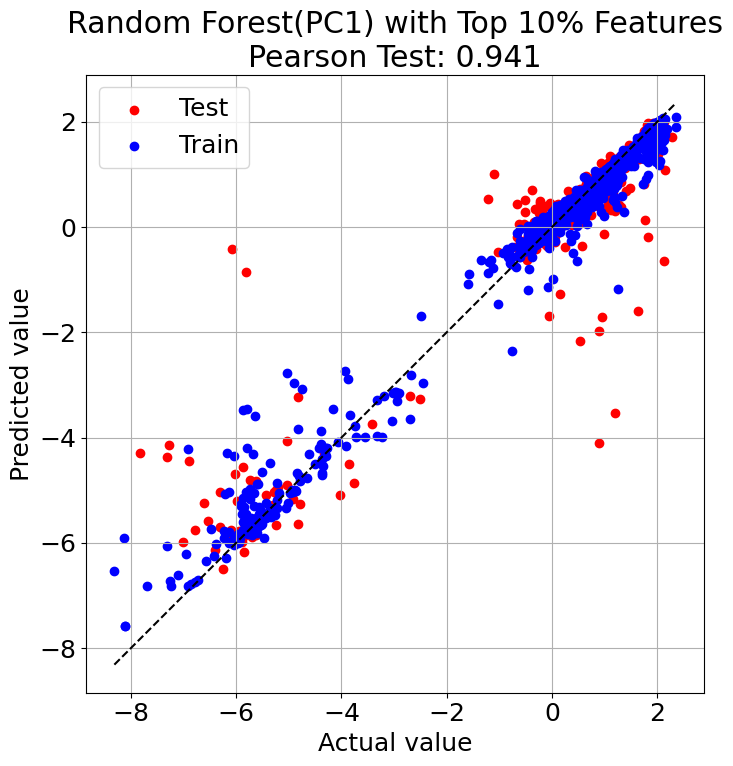

In [ ]:

feature_file = "pairwise_distance_features.csv"   
y_file = "pc1_ends_noOutliers.txt"            
out_prefix = "pc1_predict"                     
top_imp_path = f"predict/{out_prefix}/top_feature_importances.csv"

#load data & align X,y 
features_df = pd.read_csv(feature_file)         
y_df = pd.read_csv(y_file, sep=r"\s+", comment="#", names=["PCA_value", "FileName"])

merged = pd.merge(features_df, y_df, left_on="PDB_Name", right_on="FileName", how="inner")
merged = merged.drop(columns=["FileName"])

#load top features (robust to column name)
top_imp = pd.read_csv(top_imp_path)
feat_col_name = "column_name" if "column_name" in top_imp.columns else \
                ("feature" if "feature" in top_imp.columns else None)
if feat_col_name is None:
    raise ValueError(f"No feature-name column found in {top_imp_path}. "
                     "Expected 'column_name' or 'feature'.")

top_cols = top_imp[feat_col_name].tolist()   

#build X_top, y
X_top = merged[top_cols]                      
y = merged["PCA_value"].values

#split, train, predict
X_train_top, X_test_top, y_train, y_test = train_test_split(
    X_top, y, test_size=0.2, random_state=42, shuffle=True
)

rf_top = RandomForestRegressor(n_estimators=200,
        max_depth=None,
        min_samples_leaf=1,
        min_samples_split=2,
        random_state=42,
        n_jobs=-1)

rf_top.fit(X_train_top, y_train)

y_pred_test  = rf_top.predict(X_test_top)
y_pred_train = rf_top.predict(X_train_top)

#metrics
from math import sqrt
pearson_corr_test, _  = pearsonr(y_test, y_pred_test)
pearson_corr_train, _ = pearsonr(y_train, y_pred_train)
rmse_test  = sqrt(mean_squared_error(y_test, y_pred_test))
rmse_train = sqrt(mean_squared_error(y_train, y_pred_train))
print("Pearson(test):", pearson_corr_test, " RMSE(test):", rmse_test)
print("Pearson(train):", pearson_corr_train, " RMSE(train):", rmse_train)

# plot
plt.rcParams["font.size"] = 18
plt.figure(figsize=(8, 8))
plt.scatter(y_test,  y_pred_test,  color='red',  label='Test')
plt.scatter(y_train, y_pred_train, color='blue', label='Train')

ymin, ymax = min(y.min(), y_pred_train.min(), y_pred_test.min()), \
             max(y.max(), y_pred_train.max(), y_pred_test.max())
plt.plot([ymin, ymax], [ymin, ymax], 'k--')
plt.xlabel('Actual value')
plt.ylabel('Predicted value')
plt.title(f'Random Forest(PC1) with Top 10% Features\nPearson Test: {pearson_corr_test:.3f}')
plt.legend()
plt.grid(True)
plt.gca().set_aspect('equal')
plt.tight_layout()

os.makedirs(f"predict/{out_prefix}", exist_ok=True)
plt.savefig(f"predict/{out_prefix}/scatter_top10_features({out_prefix}).png", dpi=300)
plt.show()


Pearson(test): 0.9441775125464167  RMSE(test): 0.2535296298686626
Pearson(train): 0.9937359179851291  RMSE(train): 0.08614968780704817


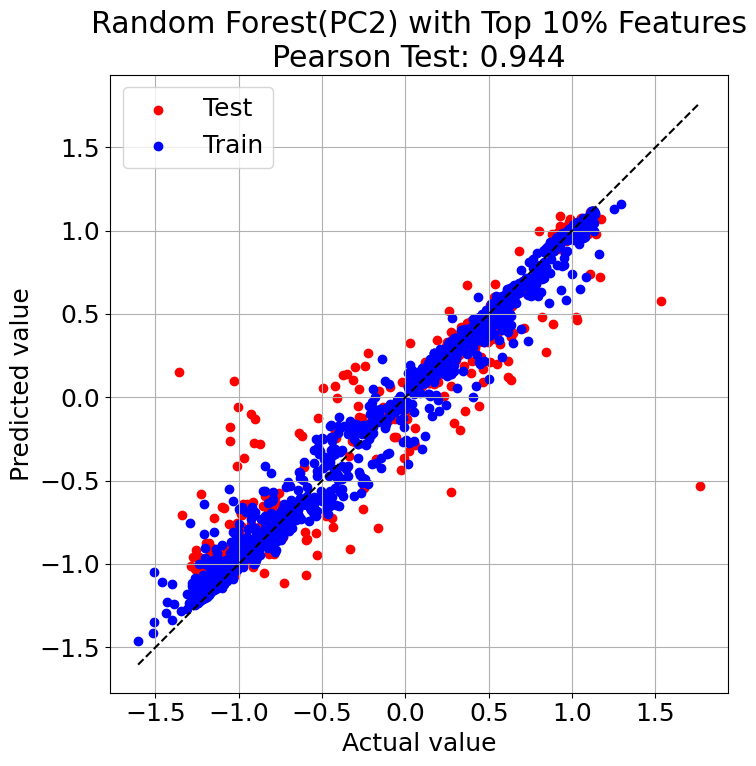

In [ ]:

feature_file = "pairwise_distance_features.csv"   
y_file = "pc2_ends_noOutliers.txt"            
out_prefix = "pc2_predict"                        
top_imp_path = f"predict/{out_prefix}/top_feature_importances.csv"

features_df = pd.read_csv(feature_file)           
y_df = pd.read_csv(y_file, sep=r"\s+", comment="#", names=["PCA_value", "FileName"])

merged = pd.merge(features_df, y_df, left_on="PDB_Name", right_on="FileName", how="inner")
merged = merged.drop(columns=["FileName"])

# load top features (robust to column name)
top_imp = pd.read_csv(top_imp_path)
feat_col_name = "column_name" if "column_name" in top_imp.columns else \
                ("feature" if "feature" in top_imp.columns else None)
if feat_col_name is None:
    raise ValueError(f"No feature-name column found in {top_imp_path}. "
                     "Expected 'column_name' or 'feature'.")

top_cols = top_imp[feat_col_name].tolist()   # e.g. ['d_0_1','d_0_2',...]

# build X_top, y
X_top = merged[top_cols]                      
y = merged["PCA_value"].values

# split, train, predict 
X_train_top, X_test_top, y_train, y_test = train_test_split(
    X_top, y, test_size=0.2, random_state=42, shuffle=True
)

rf_top = RandomForestRegressor(n_estimators=200,
        max_depth=None,
        min_samples_leaf=1,
        min_samples_split=2,
        random_state=42,
        n_jobs=-1)

rf_top.fit(X_train_top, y_train)

y_pred_test  = rf_top.predict(X_test_top)
y_pred_train = rf_top.predict(X_train_top)

#metrics 
from math import sqrt
pearson_corr_test, _  = pearsonr(y_test, y_pred_test)
pearson_corr_train, _ = pearsonr(y_train, y_pred_train)
rmse_test  = sqrt(mean_squared_error(y_test, y_pred_test))
rmse_train = sqrt(mean_squared_error(y_train, y_pred_train))
print("Pearson(test):", pearson_corr_test, " RMSE(test):", rmse_test)
print("Pearson(train):", pearson_corr_train, " RMSE(train):", rmse_train)

#  plot 
plt.rcParams["font.size"] = 18
plt.figure(figsize=(8, 8))
plt.scatter(y_test,  y_pred_test,  color='red',  label='Test')
plt.scatter(y_train, y_pred_train, color='blue', label='Train')

ymin, ymax = min(y.min(), y_pred_train.min(), y_pred_test.min()), \
             max(y.max(), y_pred_train.max(), y_pred_test.max())
plt.plot([ymin, ymax], [ymin, ymax], 'k--')
plt.xlabel('Actual value')
plt.ylabel('Predicted value')
plt.title(f'Random Forest(PC2) with Top 10% Features\nPearson Test: {pearson_corr_test:.3f}')
plt.legend()
plt.grid(True)
plt.gca().set_aspect('equal')
plt.tight_layout()

os.makedirs(f"predict/{out_prefix}", exist_ok=True)
plt.savefig(f"predict/{out_prefix}/scatter_top10_features({out_prefix}).png", dpi=300)
plt.show()


In [ ]:

def plot_top_feature_importances(
    out_prefix: str,
    k: int = 9,
    imp_file: str = "feature_importances_sorted.csv",
    save_name: str = "top_features.png",
):
    in_path = os.path.join("predict", out_prefix, imp_file)
    df = pd.read_csv(in_path)


    name_col = next(c for c in ("residue_pair", "feature", "column_name") if c in df.columns)
    top = df.nlargest(k, "importance")[[name_col, "importance"]].iloc[::-1]

    plt.rcParams["font.size"] = 18
    fig, ax = plt.subplots(figsize=(10, 6))
    bars = ax.barh(
        top[name_col],
        top["importance"],
        alpha=0.8,
        edgecolor="black",     
        linewidth=1.2,         
        color="#8fd0f6"        
    )
    ax.set_xlabel("Importance")
    ax.set_xlim(0, top["importance"].max() * 1.1)
    plt.tight_layout()

    save_name = f"top_features({out_prefix}).png"
    out_dir = os.path.join("predict", out_prefix)
    os.makedirs(out_dir, exist_ok=True)
    out_path = os.path.join(out_dir, save_name)
    fig.savefig(out_path, dpi=300)
    plt.close(fig)
    print(f"Saved: {out_path}")


plot_top_feature_importances("pc1_predict", k=9)
plot_top_feature_importances("pc2_predict", k=17)

Saved: predict/pc1_predict/top_features(pc1_predict).png
Saved: predict/pc2_predict/top_features(pc2_predict).png


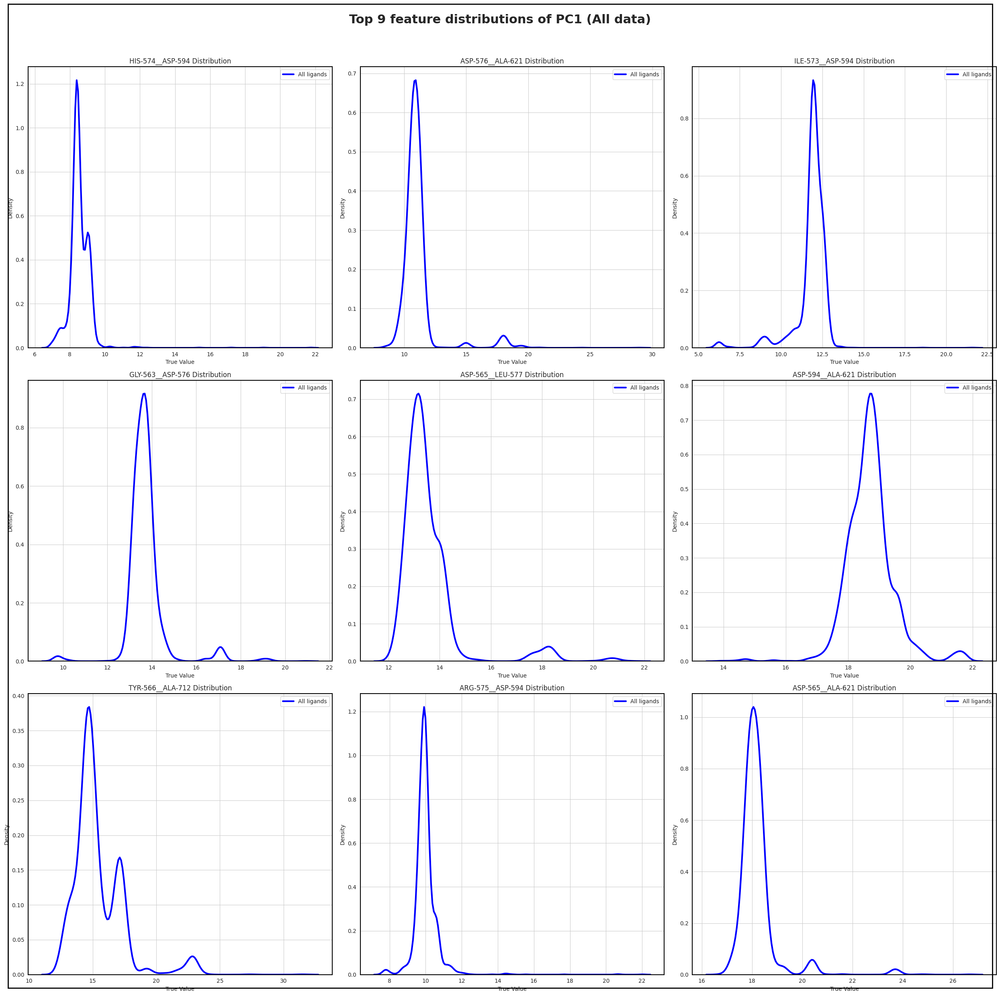

Saved: predict/pc1_predict/kde_top9(pc1_predict).png
Saved CSV: predict/pc1_predict/pcvalue_and_top9_features.csv


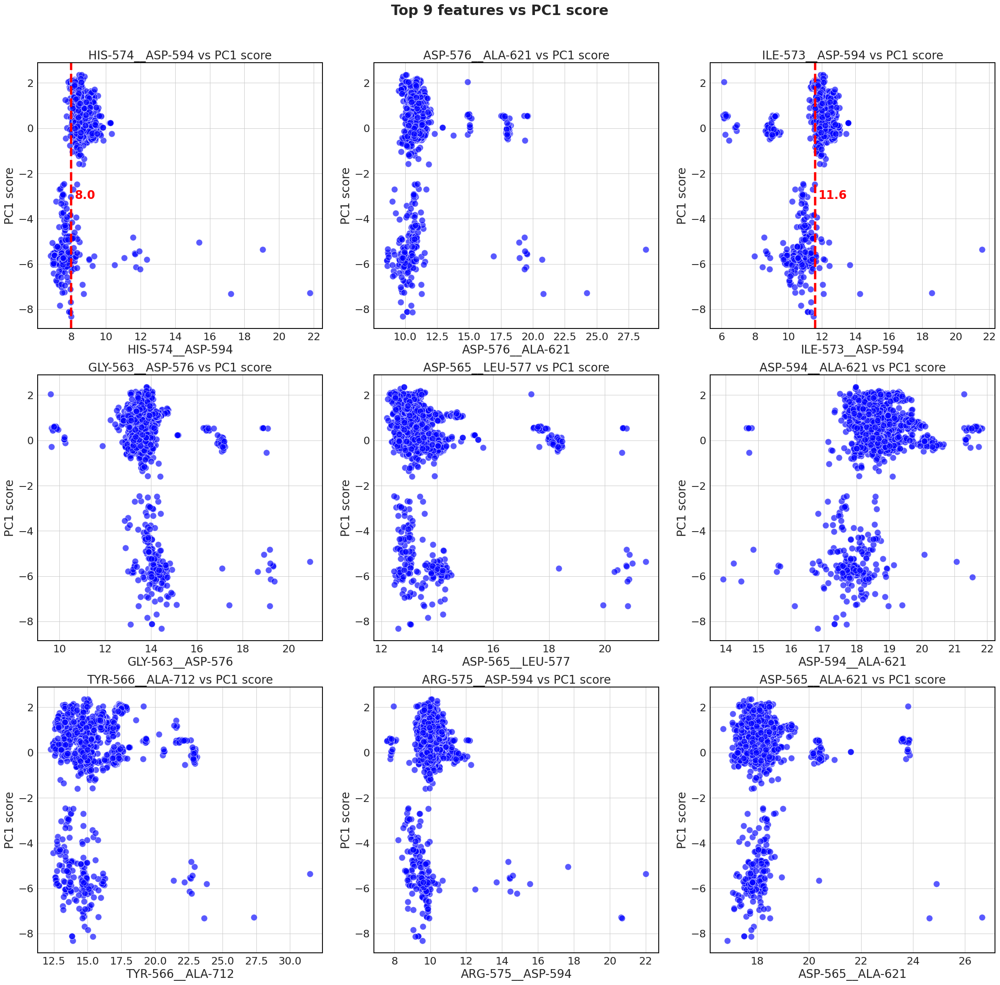

Saved: predict/pc1_predict/scatter_top9_vs_target(pc1_predict).png


In [ ]:

feature_file = "pairwise_distance_features.csv"        
out_prefix   = "pc1_predict"                              
imp_file     = f"predict/{out_prefix}/feature_importances_sorted.csv"

map_file     = "pairwise_distance_feature_map.csv"       
y_file = "pc1_ends_noOutliers.txt"

# Load full feature dataframe
df_all = pd.read_csv(feature_file)                       

# Load feature importances produced by RF model
imp = pd.read_csv(imp_file)

# Pick the appropriate feature name column (residue_pair / feature / column_name)
name_col = "residue_pair" if "residue_pair" in imp.columns else \
           ("feature" if "feature" in imp.columns else "column_name")

# If missing column_name, try to merge with external mapping file
if "column_name" not in imp.columns and os.path.exists(map_file):
    fmap = pd.read_csv(map_file) 
    if name_col == "residue_pair" and "residue_pair" in fmap.columns:
        imp = imp.merge(fmap[["residue_pair", "column_name"]], on="residue_pair", how="left")
    elif name_col == "feature" and "column_name" in fmap.columns:
        imp = imp.merge(fmap[["column_name"]], on="column_name", how="left")

# Select top-9 most important features
topK = 9
imp_top = imp.nlargest(topK, "importance").copy()
top_feature_names_for_plot = imp_top[name_col].tolist()           
top_columns_for_data       = imp_top["column_name"].tolist()     

# Verify columns exist in df_all
top_mask = [c in df_all.columns for c in top_columns_for_data]
top_feature = [n for n, m in zip(top_feature_names_for_plot, top_mask) if m]
top_cols    = [c for c, m in zip(top_columns_for_data, top_mask) if m]

df = df_all[top_cols].copy()

#Plot distributions of top features (KDE or hist if unique values < 2)
sns.set_style("whitegrid")
plt.figure(figsize=(25, 25))

for i, (feature_name, data_col) in enumerate(zip(top_feature, top_cols)):
    ax = plt.subplot(3, 3, i+1)   

    x_all = pd.to_numeric(df[data_col], errors="coerce").dropna()

    if x_all.nunique() >= 2:
        sns.kdeplot(x_all, color='blue',  label='All ligands', linewidth=3, ax=ax)
    else:
        ax.hist(x_all, bins=20, density=True, color='blue', alpha=0.3, label='All ligands')


    ax.set_title(f'{feature_name} Distribution')
    ax.set_xlabel('True Value')
    ax.set_ylabel('Density')
    ax.legend()

    for sp in ax.spines.values():
        sp.set_visible(True)
        sp.set_edgecolor('black')
        sp.set_linewidth(1.5)
    
plt.suptitle(f"Top {topK} feature distributions of PC1 (All data)", fontsize=22, weight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Add outer rectangle border around the entire figure
fig = plt.gcf()
fig.add_artist(Rectangle((0.01, 0.01), 0.98, 0.98,
                         transform=fig.transFigure, fill=False,
                         edgecolor='black', linewidth=2, zorder=1000, clip_on=False))

# Save KDE distribution plot
out_path = os.path.join("predict", out_prefix, f"kde_top{topK}({out_prefix}).png")
os.makedirs(os.path.dirname(out_path), exist_ok=True)
plt.savefig(out_path, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()
print(f"Saved: {out_path}")


if y_file.lower().endswith(".txt"):

    ydf = pd.read_csv(y_file, sep=r"\s+", comment="#", names=["Target", "PDB_Name"])
    y_label = "PC1 score"
else:
    ydf = pd.read_csv(y_file)
    if "PDB_Name" not in ydf.columns and "FileName" in ydf.columns:
        ydf = ydf.rename(columns={"FileName": "PDB_Name"})
    col_guess = [c for c in ydf.columns if c != "PDB_Name"][0]
    ydf = ydf.rename(columns={col_guess: "Target"})
    y_label = col_guess

ydf["PDB_Name"] = ydf["PDB_Name"].astype(str).str.strip()

need_cols = ["PDB_Name"] + top_cols[:topK]
df_all_for_scatter = pd.merge(df_all[need_cols], ydf[["PDB_Name", "Target"]],
                              on="PDB_Name", how="inner")

save_path_csv = os.path.join("predict", out_prefix, f"pcvalue_and_top{topK}_features.csv")
os.makedirs(os.path.dirname(save_path_csv), exist_ok=True)
df_all_for_scatter.to_csv(save_path_csv, index=False)
print(f"Saved CSV: {save_path_csv}")

y_col = "Target"
topK = min(16, len(top_cols))
fig, axes = plt.subplots(3, 3, figsize=(24, 24))
sns.set_style("whitegrid")

for i, (feat_name, data_col) in enumerate(zip(top_feature[:topK], top_cols[:topK])):
    r, c = divmod(i, 3)
    ax = axes[r, c]

    ax.scatter(
        df_all_for_scatter[data_col], df_all_for_scatter[y_col],
        s=120, c='blue', alpha=0.65,  edgecolors='white', linewidths=0.7, label='All ligands'
    )
    
    # Example threshold markers on specific features
    if i == 0:   
        ax.axvline(x=8, color='red', linestyle='--', linewidth=4)
        y_mid = (ax.get_ylim()[0] + ax.get_ylim()[1]) / 2   
        ax.text(8 + 0.2, y_mid, "8.0", color='red', fontsize=20,
                ha='left', va='center', fontweight='bold')
    if i == 2:   
        ax.axvline(x=11.6, color='red', linestyle='--', linewidth=4)
        y_mid = (ax.get_ylim()[0] + ax.get_ylim()[1]) / 2   
        ax.text(11.6 + 0.2, y_mid, "11.6", color='red', fontsize=20,
                ha='left', va='center', fontweight='bold')

    if not (r == 0 and c == 0) and ax.get_legend():
        ax.get_legend().remove()

    ax.set_title(f'{feat_name} vs {y_label}', fontsize=20)
    ax.set_xlabel(feat_name, fontsize=20)     
    ax.set_ylabel(y_label, fontsize=20)
    ax.tick_params(axis='both', which='major', labelsize=18)

    for sp in ax.spines.values():
        sp.set_visible(True)
        sp.set_edgecolor('black')
        sp.set_linewidth(1.5)

    if not (r == 0 and c == 0) and ax.get_legend():
        ax.get_legend().remove()

fig.suptitle(f"Top {topK} features vs {y_label}", fontsize=24, weight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Save scatter plot figure
out_path = os.path.join("predict", out_prefix, f"scatter_top{topK}_vs_target({out_prefix}).png")
os.makedirs(os.path.dirname(out_path), exist_ok=True)
plt.savefig(out_path, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()
print(f"Saved: {out_path}")


In [ ]:


import os, re
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from pathlib import Path

# Input files
feature_file = "pairwise_distance_features.csv"          
out_prefix   = "pc1_predict"                             
imp_file     = f"predict/{out_prefix}/feature_importances_sorted.csv"
map_file     = "pairwise_distance_feature_map.csv"        
y_file       = "pc1_ends_noOutliers.txt"                  

# Parameters
PC1_THR   = -2.0     
BW        = 0.8      
SAVE_DIR  = Path("predict")/out_prefix/"kde_split_by_pc1"
SAVE_DIR.mkdir(parents=True, exist_ok=True)

# Utility: safe filename conversion
def safe_name(s: str) -> str:
    return re.sub(r"[^\w\-]+", "_", s)

if y_file.lower().endswith(".txt"):
    ydf = pd.read_csv(y_file, sep=r"\s+", comment="#", names=["PC1", "PDB_Name"])
else:
    ydf = pd.read_csv(y_file)
    if "PDB_Name" not in ydf.columns and "FileName" in ydf.columns:
        ydf = ydf.rename(columns={"FileName": "PDB_Name"})
    pc_col = [c for c in ydf.columns if c != "PDB_Name"][0]
    ydf = ydf.rename(columns={pc_col: "PC1"})

ydf["PDB_Name"] = ydf["PDB_Name"].astype(str).str.strip()

df_all = pd.read_csv(feature_file)
imp = pd.read_csv(imp_file)

# Detect name column used in importances
name_col = "residue_pair" if "residue_pair" in imp.columns else ("feature" if "feature" in imp.columns else "column_name")

# If mapping missing, try to merge with feature map
if "column_name" not in imp.columns and os.path.exists(map_file):
    fmap = pd.read_csv(map_file)  
    if name_col == "residue_pair" and "residue_pair" in fmap.columns:
        imp = imp.merge(fmap[["residue_pair", "column_name"]], on="residue_pair", how="left")
    elif name_col == "feature" and "column_name" in fmap.columns:
        imp = imp.merge(fmap[["column_name"]], on="column_name", how="left")

# Pick specific top features (by index) for visualization
imp_sorted = imp.sort_values("importance", ascending=False).reset_index(drop=True)
pick_idx   = [0, 2]  
imp_pick   = imp_sorted.loc[pick_idx].copy()

feat_names = imp_pick[name_col].tolist()
feat_cols  = imp_pick["column_name"].tolist()

# Ensure selected columns exist in feature file
mask_exist = [c in df_all.columns for c in feat_cols]
feat_names = [n for n, m in zip(feat_names, mask_exist) if m]
feat_cols  = [c for c, m in zip(feat_cols,  mask_exist) if m]

# Merge selected features with PC1 values
need_cols = ["PDB_Name"] + feat_cols
df_feat_pc1 = pd.merge(df_all[need_cols], ydf[["PDB_Name", "PC1"]], on="PDB_Name", how="inner")


sns.set_style("whitegrid")

for fname, fcol in zip(feat_names, feat_cols):
    sub = df_feat_pc1[[fcol, "PC1"]].replace([np.inf, -np.inf], np.nan).dropna()
    x_low  = sub.loc[sub["PC1"] <  PC1_THR, fcol].astype(float)
    x_high = sub.loc[sub["PC1"] >= PC1_THR, fcol].astype(float)

    # Skip if not enough samples
    if len(x_low) < 2 and len(x_high) < 2:
        print(f"[Skip] {fname}: not enough data.")
        continue

    fig, ax = plt.subplots(figsize=(7.2, 5.2))

    lines = []
    # KDE for PC1 below threshold
    if len(x_low) >= 2:
        sns.kdeplot(x=x_low,  bw_adjust=BW, ax=ax, label="PC1 < -2",
                    color="#1f77b4", linewidth=2)
        lines.append(ax.lines[-1])

    # KDE for PC1 above threshold
    if len(x_high) >= 2:
        sns.kdeplot(x=x_high, bw_adjust=BW, ax=ax, label="PC1 > -2",
                    color="#ff7f0e", linewidth=2)
        lines.append(ax.lines[-1])

    # Find peaks (max density points) for annotation
    peaks = []  
    for ln in lines:                       
        xs, ys = ln.get_xdata(), ln.get_ydata()
        if len(xs) == 0:
            continue
        i = int(np.argmax(ys))
        peaks.append((float(xs[i]), float(ys[i]), ln.get_color()))

    # Annotate peaks with vertical lines and text
    x0, x1 = ax.get_xlim(); y0, y1 = ax.get_ylim()
    yspan = (y1 - y0)

    for px, py, color in peaks:

        ax.vlines(px, 0, py, color=color, linestyle="--", linewidth=1.2, alpha=0.9)

        y_text = min(py + 0.009*yspan, y1 - 0.009*yspan)  
        ax.text(px, y_text, f"{px:.2f}", color=color,
                fontsize=11, ha="center", va="bottom")

    ax.set_title(f"{fname} distribution split by PC1 (threshold = {PC1_THR})")
    ax.set_xlabel(fname)
    ax.set_ylabel("Density")



    ax.set_title(f"{fname} distribution split by PC1 (threshold = {PC1_THR})")
    ax.set_xlabel(fname)     
    ax.set_ylabel("Density")
    ax.legend()

    for sp in ax.spines.values():
        sp.set_visible(True); sp.set_edgecolor('black'); sp.set_linewidth(1.0)

    out_png = SAVE_DIR / f"kde_split_{safe_name(fname)}.png"
    fig.tight_layout()
    fig.savefig(out_png, dpi=300)
    plt.close(fig)
    print(f"Saved: {out_png}")


Saved: predict/pc1_predict/kde_split_by_pc1/kde_split_HIS-574__ASP-594.png
Saved: predict/pc1_predict/kde_split_by_pc1/kde_split_ILE-573__ASP-594.png


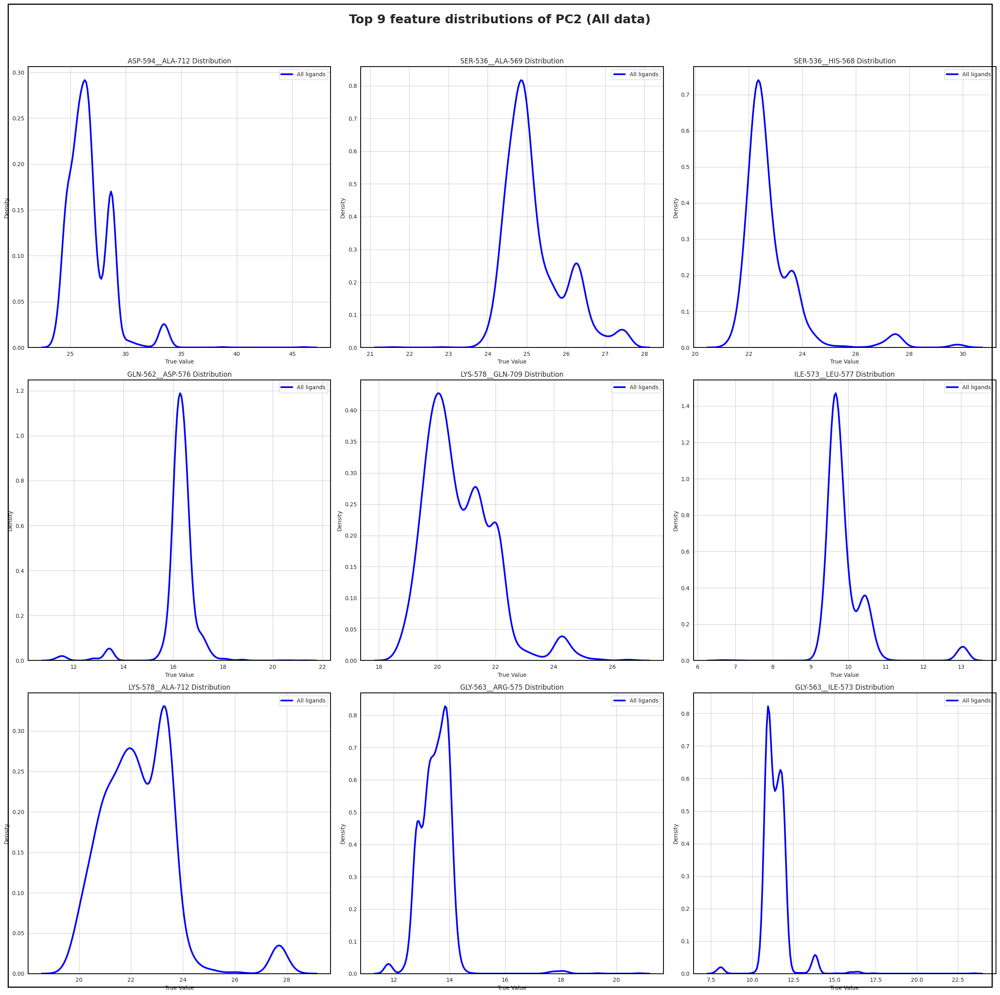

Saved: predict/pc2_predict/kde_top9(pc2_predict).png


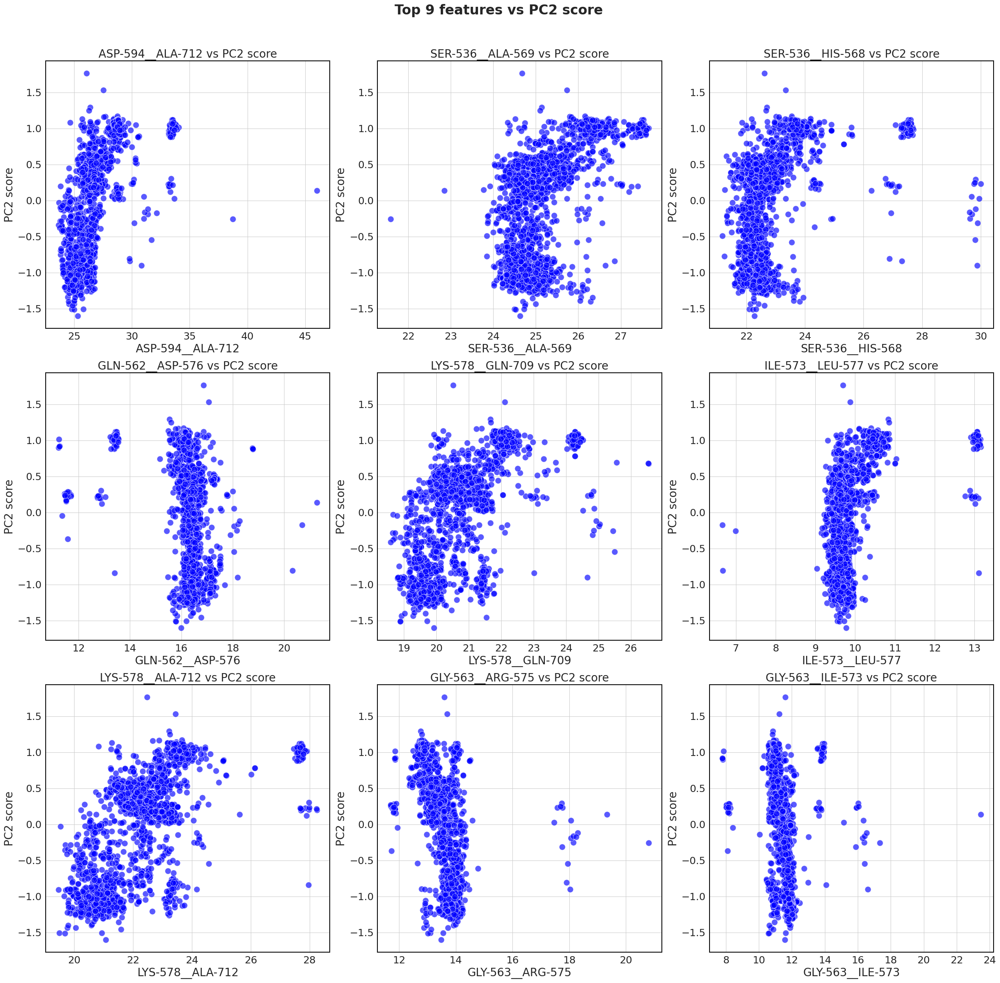

Saved: predict/pc2_predict/scatter_top9_vs_target(pc2_predict).png


In [ ]:

feature_file = "pairwise_distance_features.csv"         
out_prefix   = "pc2_predict"                              
imp_file     = f"predict/{out_prefix}/feature_importances_sorted.csv"

map_file     = "pairwise_distance_feature_map.csv"       
y_file = "pc2_ends_noOutliers.txt"

df_all = pd.read_csv(feature_file)                        

# Load feature importances
imp = pd.read_csv(imp_file)

# Decide which column stores feature names (residue_pair / feature / column_name)
name_col = "residue_pair" if "residue_pair" in imp.columns else \
           ("feature" if "feature" in imp.columns else "column_name")

# If missing mapping, merge with external mapping file
if "column_name" not in imp.columns and os.path.exists(map_file):
    fmap = pd.read_csv(map_file)  
    if name_col == "residue_pair" and "residue_pair" in fmap.columns:
        imp = imp.merge(fmap[["residue_pair", "column_name"]], on="residue_pair", how="left")
    elif name_col == "feature" and "column_name" in fmap.columns:
        imp = imp.merge(fmap[["column_name"]], on="column_name", how="left")

# Take top-9 most important features
topK = 9
imp_top = imp.nlargest(topK, "importance").copy()
top_feature_names_for_plot = imp_top[name_col].tolist()           
top_columns_for_data       = imp_top["column_name"].tolist()     

# Filter to keep only columns existing in df_all
top_mask = [c in df_all.columns for c in top_columns_for_data]
top_feature = [n for n, m in zip(top_feature_names_for_plot, top_mask) if m]
top_cols    = [c for c, m in zip(top_columns_for_data, top_mask) if m]

df = df_all[top_cols].copy()

#KDE distributions of top features
sns.set_style("whitegrid")
plt.figure(figsize=(25, 25))

for i, (feature_name, data_col) in enumerate(zip(top_feature, top_cols)):
    ax = plt.subplot(3, 3, i+1)   

    x_all = pd.to_numeric(df[data_col], errors="coerce").dropna()

    if x_all.nunique() >= 2:
        sns.kdeplot(x_all, color='blue',  label='All ligands', linewidth=3, ax=ax)
    else:
        ax.hist(x_all, bins=20, density=True, color='blue', alpha=0.3, label='All ligands')


    ax.set_title(f'{feature_name} Distribution')
    ax.set_xlabel('True Value')
    ax.set_ylabel('Density')
    ax.legend()

    for sp in ax.spines.values():
        sp.set_visible(True)
        sp.set_edgecolor('black')
        sp.set_linewidth(1.5)
    
plt.suptitle(f"Top {topK} feature distributions of PC2 (All data)", fontsize=22, weight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Add outer rectangle border around figure
fig = plt.gcf()
fig.add_artist(Rectangle((0.01, 0.01), 0.98, 0.98,
                         transform=fig.transFigure, fill=False,
                         edgecolor='black', linewidth=2, zorder=1000, clip_on=False))

# Save KDE plot
out_path = os.path.join("predict", out_prefix, f"kde_top{topK}({out_prefix}).png")
os.makedirs(os.path.dirname(out_path), exist_ok=True)
plt.savefig(out_path, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()
print(f"Saved: {out_path}")

#Load target file for scatter plots
if y_file.lower().endswith(".txt"):
    ydf = pd.read_csv(y_file, sep=r"\s+", comment="#", names=["Target", "PDB_Name"])
    y_label = "PC2 score"
else:
    ydf = pd.read_csv(y_file)
    if "PDB_Name" not in ydf.columns and "FileName" in ydf.columns:
        ydf = ydf.rename(columns={"FileName": "PDB_Name"})
    col_guess = [c for c in ydf.columns if c != "PDB_Name"][0]
    ydf = ydf.rename(columns={col_guess: "Target"})
    y_label = col_guess

ydf["PDB_Name"] = ydf["PDB_Name"].astype(str).str.strip()

# Merge top features with PC2 values
need_cols = ["PDB_Name"] + top_cols[:topK]
df_all_for_scatter = pd.merge(df_all[need_cols], ydf[["PDB_Name", "Target"]],
                              on="PDB_Name", how="inner")

#Scatter plots of top features vs PC2
y_col = "Target"
topK = min(16, len(top_cols))
fig, axes = plt.subplots(3, 3, figsize=(25, 25))
sns.set_style("whitegrid")

for i, (feat_name, data_col) in enumerate(zip(top_feature[:topK], top_cols[:topK])):
    r, c = divmod(i, 3)
    ax = axes[r, c]

    ax.scatter(
        df_all_for_scatter[data_col], df_all_for_scatter[y_col],
        s=120, c='blue', alpha=0.65,  edgecolors='white', linewidths=0.7, label='All ligands'
    )

    if not (r == 0 and c == 0) and ax.get_legend():
        ax.get_legend().remove()

    ax.set_title(f'{feat_name} vs {y_label}', fontsize=20)
    ax.set_xlabel(feat_name, fontsize=20)     
    ax.set_ylabel(y_label, fontsize=20)
    ax.tick_params(axis='both', which='major', labelsize=18)


    for sp in ax.spines.values():
        sp.set_visible(True)
        sp.set_edgecolor('black')
        sp.set_linewidth(1.5)


    if not (r == 0 and c == 0) and ax.get_legend():
        ax.get_legend().remove()

fig.suptitle(f"Top {topK} features vs {y_label}", fontsize=24, weight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Save scatter plots
out_path = os.path.join("predict", out_prefix, f"scatter_top{topK}_vs_target({out_prefix}).png")
os.makedirs(os.path.dirname(out_path), exist_ok=True)
plt.savefig(out_path, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()
print(f"Saved: {out_path}")


Prediction of encoder

In [ ]:
def _read_encoder_coords(train_csv, test_csv):
    """
    Read autoencoder 2D latent coordinates from train/test CSV files.
    Expected CSV columns: first two columns are z1 and z2, last contains PDB file names.
    Returns a DataFrame with columns: ['z1', 'z2', 'FileName'].
    """
    df_tr = pd.read_csv(train_csv)
    df_te = pd.read_csv(test_csv)
    df = pd.concat([df_tr, df_te], ignore_index=True)

    # Rename columns to standard names (z1, z2, pdb_filename, idx)
    rename_map = {}
    for col in df.columns:
        cs = str(col).strip()
        if cs == '0': rename_map[col] = 'z1'
        elif cs == '1': rename_map[col] = 'z2'
        elif 'pdb' in cs.lower(): rename_map[col] = 'pdb_filename'
        elif 'index' in cs.lower(): rename_map[col] = 'idx'
    df = df.rename(columns=rename_map)

    # Remove ".pdb" extension for merging
    df['FileName'] = df['pdb_filename'].astype(str).str.strip().str.replace('.pdb', '', regex=False)
    return df[['z1', 'z2', 'FileName']]

def random_forest_predict_encoder2d(
    feature_file: str,
    enc_train_csv: str,
    enc_test_csv: str,
    out_prefix: str,
    test_size: float = 0.20,
    random_state: int = 42,
    drop_cols=("Folder",),
    mapping_file: str = "pairwise_distance_feature_map.csv",
):
    out_dir = os.path.join("predict", out_prefix)
    os.makedirs(out_dir, exist_ok=True)

    #Load features
    feats = pd.read_csv(feature_file)
    for c in drop_cols:
        if c in feats.columns:
            feats = feats.drop(columns=[c])
    feats["PDB_Name"] = feats["PDB_Name"].astype(str).str.strip()

    #Load 2D encoder coordinates
    ydf = _read_encoder_coords(enc_train_csv, enc_test_csv)
    merged = pd.merge(
        feats, ydf, left_on="PDB_Name", right_on="FileName",
        how="inner", validate="one_to_one"
    )
    if merged.empty:
        raise ValueError("Merge result is empty — check PDB_Name vs FileName matching.")

    # Features = all numeric columns except identifiers and targets
    feature_cols = [c for c in merged.columns if c not in ["PDB_Name", "FileName", "z1", "z2"]]
    X = merged[feature_cols].values
    y = merged[["z1", "z2"]].values
    names = merged["PDB_Name"].values

    # Train/test split
    X_tr, X_te, y_tr, y_te, n_tr, n_te = train_test_split(
        X, y, names, test_size=test_size, random_state=random_state, shuffle=True
    )

    #Define Random Forest regressor
    rf = RandomForestRegressor(
        n_estimators=200, n_jobs=-1, random_state=random_state, verbose=False
    )

    # Custom scorers: average R2 and MSE across both dimensions (z1, z2)
    def multi_r2(y_true, y_pred):
        return np.mean([r2_score(y_true[:, i], y_pred[:, i]) for i in range(y_true.shape[1])])

    def multi_mse(y_true, y_pred):
        return np.mean([mean_squared_error(y_true[:, i], y_pred[:, i]) for i in range(y_true.shape[1])])

    r2_scorer  = make_scorer(multi_r2, greater_is_better=True)
    mse_scorer = make_scorer(multi_mse, greater_is_better=False)

    kf = KFold(n_splits=5, shuffle=True, random_state=random_state)
    cv_r2  = cross_val_score(rf, X_tr, y_tr, cv=kf, scoring=r2_scorer)
    cv_mse = -cross_val_score(rf, X_tr, y_tr, cv=kf, scoring=mse_scorer)

    rf.fit(X_tr, y_tr)

    # Save trained model
    model_path = os.path.join(out_dir, "rf_encoder2d.joblib")
    dump(rf, model_path)
    print(f"Saved model to {model_path}")

    y_tr_pred = rf.predict(X_tr)
    y_te_pred = rf.predict(X_te)

    # Metrics per dimension (Pearson, R2, MSE)
    def per_dim_metrics(y_true, y_pred):
        out = []
        for i, tag in enumerate(["z1", "z2"]):
            pear, _ = pearsonr(y_true[:, i], y_pred[:, i])
            out.append((tag, pear, r2_score(y_true[:, i], y_pred[:, i]), mean_squared_error(y_true[:, i], y_pred[:, i])))
        return out

    train_mets = per_dim_metrics(y_tr, y_tr_pred)
    test_mets  = per_dim_metrics(y_te, y_te_pred)

    with open(os.path.join(out_dir, "metrics.txt"), "w") as f:
        f.write(f"CV-5Fold R2(avg):  mean={np.mean(cv_r2):.6f}, std={np.std(cv_r2):.6f}\n")
        f.write(f"CV-5Fold MSE(avg): mean={np.mean(cv_mse):.6f}, std={np.std(cv_mse):.6f}\n\n")
        for title, mets in (("Train", train_mets), ("Test", test_mets)):
            for tag, pear, r2v, mse in mets:
                f.write(f"{title}-{tag}: Pearson={pear:.6f}, R2={r2v:.6f}, MSE={mse:.6f}\n")

    pd.Series(n_tr, name="PDB_Name").to_csv(os.path.join(out_dir, "train_names.txt"), index=False)
    pd.Series(n_te, name="PDB_Name").to_csv(os.path.join(out_dir, "test_names.txt"), index=False)

    pd.DataFrame({
        "FileName": n_tr,
        "Actual_z1": y_tr[:, 0], "Pred_z1": y_tr_pred[:, 0],
        "Actual_z2": y_tr[:, 1], "Pred_z2": y_tr_pred[:, 1],
    }).to_csv(os.path.join(out_dir, "train_pred.csv"), index=False)

    pd.DataFrame({
        "FileName": n_te,
        "Actual_z1": y_te[:, 0], "Pred_z1": y_te_pred[:, 0],
        "Actual_z2": y_te[:, 1], "Pred_z2": y_te_pred[:, 1],
    }).to_csv(os.path.join(out_dir, "test_pred.csv"), index=False)

    importances = rf.feature_importances_
    fi_df = pd.DataFrame({
        "column_name": feature_cols,
        "importance": importances
    }).sort_values("importance", ascending=False)

    if mapping_file and os.path.exists(mapping_file):
        fmap = pd.read_csv(mapping_file)
        if {"column_name", "residue_pair"}.issubset(fmap.columns):
            fi_df = fi_df.merge(fmap[["column_name", "residue_pair"]], on="column_name", how="left")

    # Save importances
    fi_path = os.path.join(out_dir, "feature_importances_sorted.csv")
    fi_df.to_csv(fi_path, index=False)

    top_n = max(1, int(np.ceil(0.10 * len(feature_cols))))
    fi_top = fi_df.iloc[:top_n].copy()
    fi_top_path = os.path.join(out_dir, "top_feature_importances.csv")
    fi_top.to_csv(fi_top_path, index=False)

    print(f"Saved feature importances to:\n  {fi_path}\n  {fi_top_path}")

    #Scatter plots of Actual vs Predicted (per dimension)
    def scatter_panel(dim_idx, tag, save_name):
        plt.rcParams["font.size"] = 18
        fig, ax = plt.subplots(figsize=(8, 8))
        plt.scatter(y_te[:, dim_idx], y_te_pred[:, dim_idx], color='red',  label='Test')
        plt.scatter(y_tr[:, dim_idx], y_tr_pred[:, dim_idx], color='blue', label='Train')
        all_vals = np.concatenate([
            y_tr[:, dim_idx], y_te[:, dim_idx],
            y_tr_pred[:, dim_idx], y_te_pred[:, dim_idx]
        ])
        lo, hi = all_vals.min(), all_vals.max()
        plt.plot([lo, hi], [lo, hi], color='red')
        (t_tag, t_pear, _, _) = next(m for m in train_mets if m[0] == tag)
        (v_tag, v_pear, _, _) = next(m for m in test_mets  if m[0] == tag)
        plt.xlabel('Actual Values'); plt.ylabel('Predicted Values')
        plt.title(f'Actual vs Predicted (Encoder {tag})\n'
                  f'Train Pearson: {t_pear:.3f}, Test Pearson: {v_pear:.3f}')
        plt.legend(); plt.gca().set_aspect('equal', adjustable='box')
        buf = 0.05 * (y_te[:, dim_idx].max() - y_te[:, dim_idx].min())
        ax.set_xlim(y_te[:, dim_idx].min() - buf, y_te[:, dim_idx].max() + buf)
        ax.set_ylim(y_te[:, dim_idx].min() - buf, y_te[:, dim_idx].max() + buf)
        plt.tight_layout()
        fig.savefig(os.path.join(out_dir, save_name), dpi=300)
        plt.close(fig)

    scatter_panel(0, "z1", f"scatter_z1({out_prefix}).png")
    scatter_panel(1, "z2", f"scatter_z2({out_prefix}).png")


    return {"out_dir": out_dir}

random_forest_predict_encoder2d(
    feature_file="pairwise_distance_features.csv",
    enc_train_csv="Results/run_trial_BRAFActivationLoop_postalign_cleaned_noOutlier_11_checkpoint_newsplit/landscape_encoded_train_coordinates.csv",
    enc_test_csv ="Results/run_trial_BRAFActivationLoop_postalign_cleaned_noOutlier_11_checkpoint_newsplit/landscape_encoded_test_coordinates.csv",
    out_prefix="encoder_z_predict",   
    test_size=0.10,
    random_state=42,
    drop_cols=("Folder",),            
    mapping_file="pairwise_distance_feature_map.csv" 
)


Saved model to predict/encoder_z_predict/rf_encoder2d.joblib
Saved feature importances to:
  predict/encoder_z_predict/feature_importances_sorted.csv
  predict/encoder_z_predict/top_feature_importances.csv


{'out_dir': 'predict/encoder_z_predict'}

In [ ]:

def plot_top_feature_importances(
    out_prefix: str,
    k: int = 20,
    imp_file: str = "feature_importances_sorted.csv",
    save_name: str = "top_features.png",
):
    in_path = os.path.join("predict", out_prefix, imp_file)
    df = pd.read_csv(in_path)

    name_col = next(c for c in ("residue_pair", "feature", "column_name") if c in df.columns)
    top = df.nlargest(k, "importance")[[name_col, "importance"]].iloc[::-1]

    plt.rcParams["font.size"] = 18
    fig, ax = plt.subplots(figsize=(10, 6))
    bars = ax.barh(
        top[name_col],
        top["importance"],
        alpha=0.8,
        edgecolor="black",    
        linewidth=1.2,         
        color="#8fd0f6"       
    )
    ax.set_xlabel("Importance")
    ax.set_xlim(0, top["importance"].max() * 1.1)
    plt.tight_layout()

    save_name = f"top_features({out_prefix}).png"
    out_dir = os.path.join("predict", out_prefix)
    os.makedirs(out_dir, exist_ok=True)
    out_path = os.path.join(out_dir, save_name)
    fig.savefig(out_path, dpi=300)
    plt.close(fig)
    print(f"Saved: {out_path}")


plot_top_feature_importances("encoder_z_predict", k=13)

Saved: predict/encoder_z_predict/top_features(encoder_z_predict).png


In [ ]:

feature_file = "pairwise_distance_features.csv"
enc_train_csv = "Results/run_trial_BRAFActivationLoop_postalign_cleaned_noOutlier_11_checkpoint_newsplit/landscape_encoded_train_coordinates.csv"
enc_test_csv  = "Results/run_trial_BRAFActivationLoop_postalign_cleaned_noOutlier_11_checkpoint_newsplit/landscape_encoded_test_coordinates.csv"
out_prefix = "encoder_z_predict"
top_imp_path = f"predict/{out_prefix}/top_feature_importances.csv" 
out_dir = f"predict/{out_prefix}"
os.makedirs(out_dir, exist_ok=True)


feats = pd.read_csv(feature_file)
feats["PDB_Name"] = feats["PDB_Name"].astype(str).str.strip()


def read_enc(tr_csv, te_csv):
    df = pd.concat([pd.read_csv(tr_csv), pd.read_csv(te_csv)], ignore_index=True)
    z1_col, z2_col = df.columns[:2]
    pdb_col = [c for c in df.columns if "pdb" in str(c).lower()][0]
    out = pd.DataFrame({
        "z1": pd.to_numeric(df[z1_col], errors="coerce"),
        "z2": pd.to_numeric(df[z2_col], errors="coerce"),
        "FileName": df[pdb_col].astype(str).str.strip().str.replace(".pdb","",regex=False)
    })
    return out.dropna(subset=["z1","z2"])

ydf = read_enc(enc_train_csv, enc_test_csv)

merged = pd.merge(feats, ydf, left_on="PDB_Name", right_on="FileName",
                  how="inner", validate="one_to_one")


top_imp = pd.read_csv(top_imp_path)
feat_col_name = "column_name" if "column_name" in top_imp.columns \
                else ("feature" if "feature" in top_imp.columns else None)
if feat_col_name is None:
    raise ValueError("top_feature_importances.csv 中没有列名，期待 column_name 或 feature")

top_cols = [c for c in top_imp[feat_col_name].tolist() if c in merged.columns]


X = merged[top_cols].values
y = merged[["z1","z2"]].values
names = merged["PDB_Name"].values

X_tr, X_te, y_tr, y_te, n_tr, n_te = train_test_split(
    X, y, names, test_size=0.2, random_state=42, shuffle=True
)


rf = RandomForestRegressor(n_estimators=200, n_jobs=-1, random_state=42, verbose=False)

def multi_r2(y_true, y_pred):  return np.mean([r2_score(y_true[:,i], y_pred[:,i]) for i in range(2)])
def multi_mse(y_true, y_pred): return np.mean([mean_squared_error(y_true[:,i], y_pred[:,i]) for i in range(2)])

kf = KFold(n_splits=5, shuffle=True, random_state=42)
cv_r2  = cross_val_score(rf, X_tr, y_tr, cv=kf, scoring=make_scorer(multi_r2))
cv_mse = -cross_val_score(rf, X_tr, y_tr, cv=kf, scoring=make_scorer(multi_mse, greater_is_better=False))

rf.fit(X_tr, y_tr)
dump(rf, os.path.join(out_dir, "rf_encoder2d_top10.joblib"))

y_tr_pred = rf.predict(X_tr); y_te_pred = rf.predict(X_te)

def metrics_1d(y_true, y_pred):
    pear, _ = pearsonr(y_true, y_pred)
    return pear, r2_score(y_true, y_pred), mean_squared_error(y_true, y_pred)

print(f"[Top10%] CV R²(avg): {cv_r2.mean():.4f} ± {cv_r2.std():.4f}")
print(f"[Top10%] CV MSE(avg): {cv_mse.mean():.4f} ± {cv_mse.std():.4f}")
for i, tag in enumerate(["z1","z2"]):
    p_t, r_t, m_t = metrics_1d(y_tr[:,i], y_tr_pred[:,i])
    p_v, r_v, m_v = metrics_1d(y_te[:,i], y_te_pred[:,i])
    print(f"Train-{tag}: Pearson={p_t:.4f}, R²={r_t:.4f}, MSE={m_t:.4f}")
    print(f"Test -{tag}: Pearson={p_v:.4f}, R²={r_v:.4f}, MSE={m_v:.4f}")


def scatter_panel(dim_idx, tag):
    fig, ax = plt.subplots(figsize=(8,8))
    ax.scatter(y_te[:,dim_idx], y_te_pred[:,dim_idx], color='red',  label='Test')
    ax.scatter(y_tr[:,dim_idx], y_tr_pred[:,dim_idx], color='blue', label='Train')
    lo = min(y_tr[:,dim_idx].min(), y_te[:,dim_idx].min(), y_tr_pred[:,dim_idx].min(), y_te_pred[:,dim_idx].min())
    hi = max(y_tr[:,dim_idx].max(), y_te[:,dim_idx].max(), y_tr_pred[:,dim_idx].max(), y_te_pred[:,dim_idx].max())
    ax.plot([lo,hi],[lo,hi],'k--')
    ax.set_xlabel("Actual Values"); ax.set_ylabel("Predicted Values")
    ax.set_title(f'Encoder {tag} with Top 10% Features')
    ax.legend(); ax.set_aspect('equal'); plt.tight_layout()
    fig.savefig(os.path.join(out_dir, f"scatter_{tag}_top10({out_prefix}).png"), dpi=300); plt.close(fig)

scatter_panel(0, "z1")
scatter_panel(1, "z2")


pd.Series(n_tr, name="PDB_Name").to_csv(os.path.join(out_dir,"train_names.txt"), index=False)
pd.Series(n_te, name="PDB_Name").to_csv(os.path.join(out_dir,"test_names.txt"), index=False)
pd.DataFrame({"FileName":n_tr, "Actual_z1":y_tr[:,0], "Pred_z1":y_tr_pred[:,0],
                         "Actual_z2":y_tr[:,1], "Pred_z2":y_tr_pred[:,1]}).to_csv(
    os.path.join(out_dir,"train_pred_top10.csv"), index=False)
pd.DataFrame({"FileName":n_te, "Actual_z1":y_te[:,0], "Pred_z1":y_te_pred[:,0],
                         "Actual_z2":y_te[:,1], "Pred_z2":y_te_pred[:,1]}).to_csv(
    os.path.join(out_dir,"test_pred_top10.csv"), index=False)


[Top10%] CV R²(avg): 0.8903 ± 0.0188
[Top10%] CV MSE(avg): 296.6299 ± 55.5168
Train-z1: Pearson=0.9952, R²=0.9898, MSE=28.6195
Test -z1: Pearson=0.9603, R²=0.9204, MSE=216.9610
Train-z2: Pearson=0.9922, R²=0.9826, MSE=46.3729
Test -z2: Pearson=0.9439, R²=0.8906, MSE=295.1400


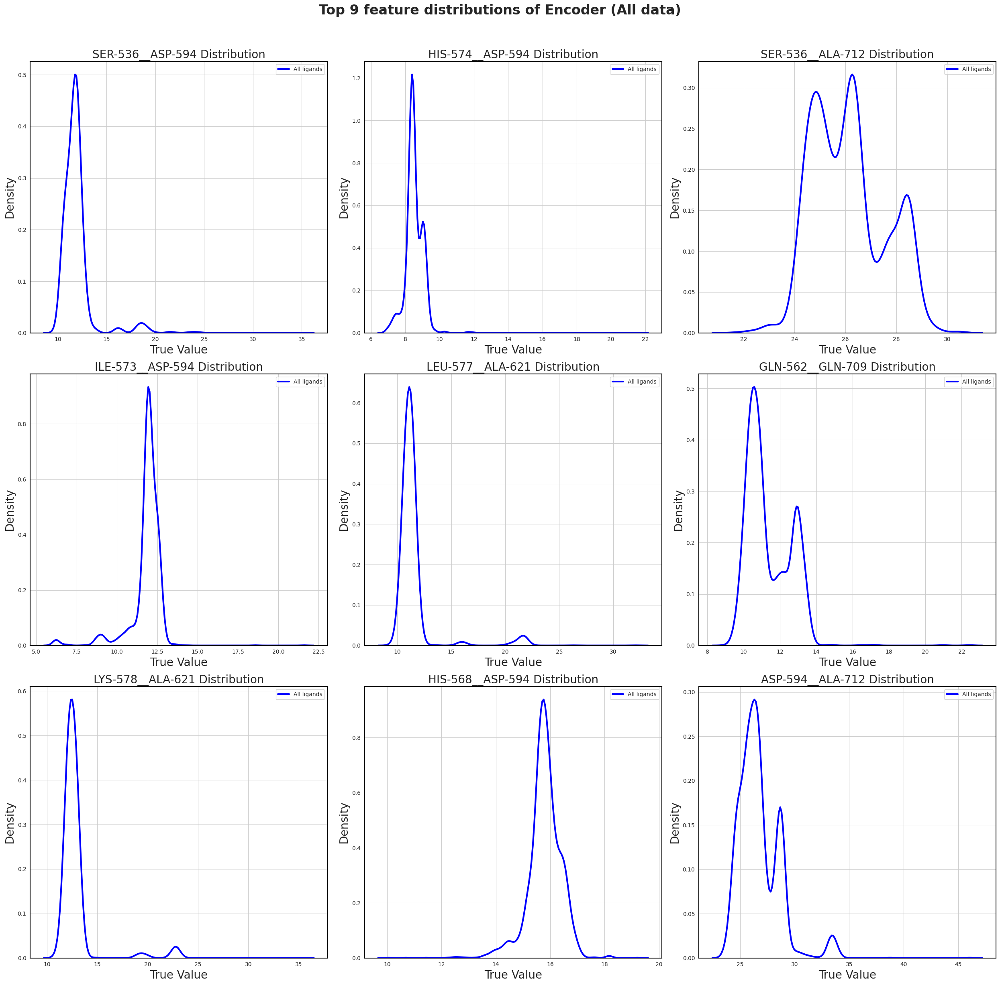

Saved: predict/encoder_z_predict/kde_top9(encoder_z_predict).png


In [ ]:

feature_file = "pairwise_distance_features.csv"          
out_prefix   = "encoder_z_predict"                              
imp_file     = f"predict/{out_prefix}/feature_importances_sorted.csv"

map_file     = "pairwise_distance_feature_map.csv"       



df_all = pd.read_csv(feature_file)                        
imp = pd.read_csv(imp_file)


name_col = "residue_pair" if "residue_pair" in imp.columns else \
           ("feature" if "feature" in imp.columns else "column_name")


if "column_name" not in imp.columns and os.path.exists(map_file):
    fmap = pd.read_csv(map_file)  
    if name_col == "residue_pair" and "residue_pair" in fmap.columns:
        imp = imp.merge(fmap[["residue_pair", "column_name"]], on="residue_pair", how="left")
    elif name_col == "feature" and "column_name" in fmap.columns:
        imp = imp.merge(fmap[["column_name"]], on="column_name", how="left")


topK = 9
imp_top = imp.nlargest(topK, "importance").copy()
top_feature_names_for_plot = imp_top[name_col].tolist()           
top_columns_for_data       = imp_top["column_name"].tolist()      

top_mask = [c in df_all.columns for c in top_columns_for_data]
top_feature = [n for n, m in zip(top_feature_names_for_plot, top_mask) if m]
top_cols    = [c for c, m in zip(top_columns_for_data, top_mask) if m]

df = df_all[top_cols].copy()

sns.set_style("whitegrid")
plt.figure(figsize=(25, 25))

for i, (feature_name, data_col) in enumerate(zip(top_feature, top_cols)):
    ax = plt.subplot(3, 3, i+1)  

    x_all = pd.to_numeric(df[data_col], errors="coerce").dropna()

    if x_all.nunique() >= 2:
        sns.kdeplot(x_all, color='blue',  label='All ligands', linewidth=3, ax=ax)
    else:
        ax.hist(x_all, bins=20, density=True, color='blue', alpha=0.3, label='All ligands')


    ax.set_title(f'{feature_name} Distribution', fontsize=20)
    ax.set_xlabel('True Value', fontsize=20)
    ax.set_ylabel('Density', fontsize=20)
    ax.legend()

    for sp in ax.spines.values():
        sp.set_visible(True)
        sp.set_edgecolor('black')
        sp.set_linewidth(1.5)
    
plt.suptitle(f"Top {topK} feature distributions of Encoder (All data)", fontsize=24, weight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.96])


fig = plt.gcf()

out_path = os.path.join("predict", out_prefix, f"kde_top{topK}({out_prefix}).png")
os.makedirs(os.path.dirname(out_path), exist_ok=True)
plt.savefig(out_path, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()
print(f"Saved: {out_path}")

Feature values with encoder z1/z2 saved to: predict/encoder_z_predict/features_with_z1_z2_top9.csv


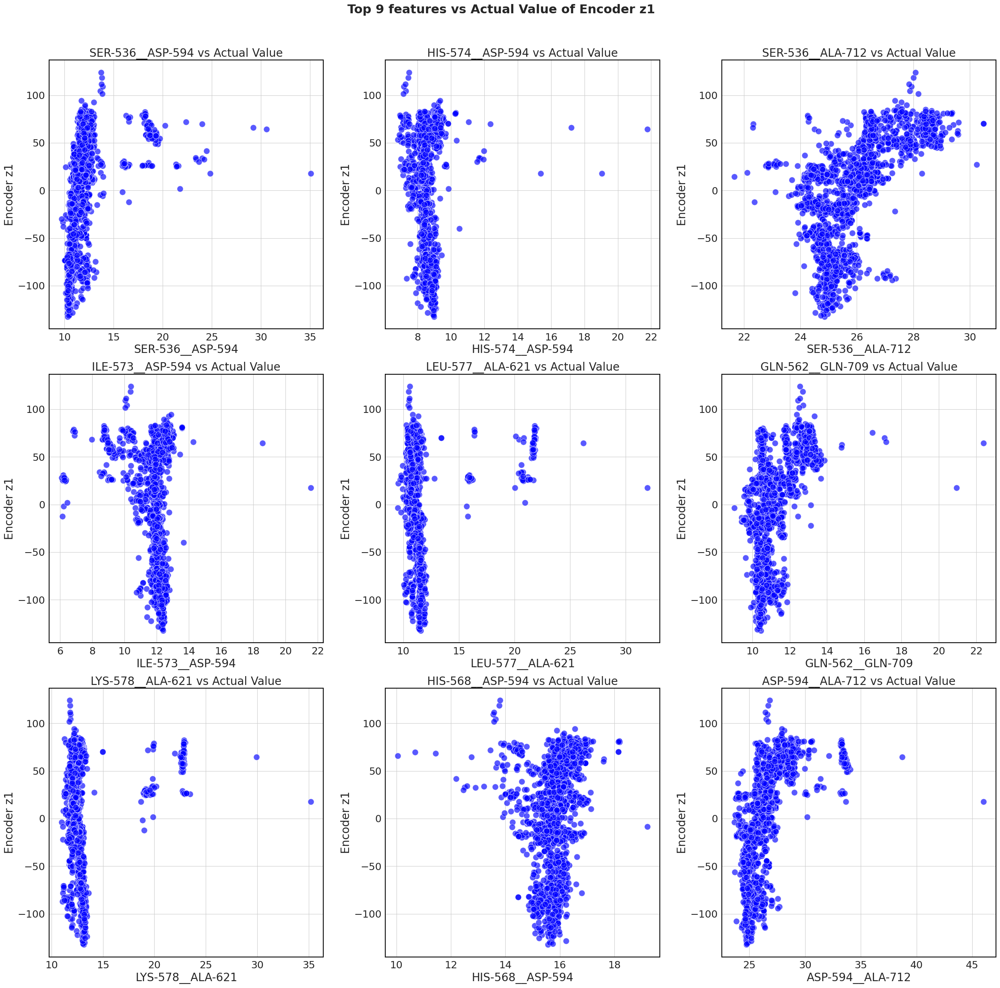

Saved: predict/encoder_z_predict/scatter_top9_vs_z1(encoder_z_predict).png


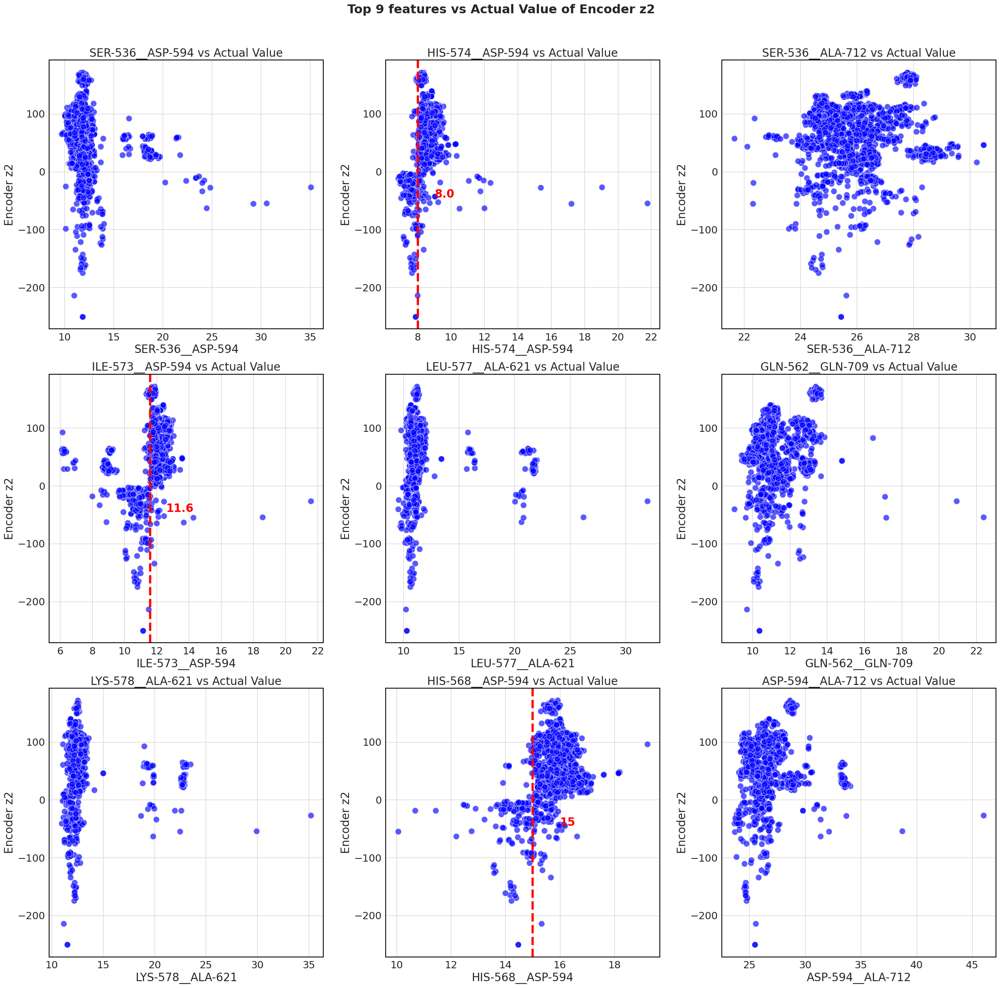

Saved: predict/encoder_z_predict/scatter_top9_vs_z2(encoder_z_predict).png


In [ ]:

enc_train_csv = "Results/run_trial_BRAFActivationLoop_postalign_cleaned_noOutlier_11_checkpoint_newsplit/landscape_encoded_train_coordinates.csv"
enc_test_csv  = "Results/run_trial_BRAFActivationLoop_postalign_cleaned_noOutlier_11_checkpoint_newsplit/landscape_encoded_test_coordinates.csv"


df_tr = pd.read_csv(enc_train_csv)
df_te = pd.read_csv(enc_test_csv)
enc_df = pd.concat([df_tr, df_te], ignore_index=True)

rename_map = {}
for col in enc_df.columns:
    cs = str(col).strip()
    if cs == '0': rename_map[col] = 'z1'
    elif cs == '1': rename_map[col] = 'z2'
    elif 'pdb' in cs.lower(): rename_map[col] = 'pdb_filename'
    elif 'index' in cs.lower(): rename_map[col] = 'idx'
enc_df = enc_df.rename(columns=rename_map)


enc_df["PDB_Name"] = (
    enc_df["pdb_filename"].astype(str).str.strip().str.replace(".pdb", "", regex=False)
)


need_cols = ["PDB_Name"] + top_cols[:topK]
df_all_for_scatter = pd.merge(
    df_all[need_cols], enc_df[["PDB_Name", "z1", "z2"]],
    on="PDB_Name", how="inner"
)

save_cols = ["PDB_Name"] + top_cols[:topK] + ["z1", "z2"]
out_csv = os.path.join("predict", "encoder_z_predict", f"features_with_z1_z2_top{topK}.csv")
os.makedirs(os.path.dirname(out_csv), exist_ok=True)
df_all_for_scatter[save_cols].to_csv(out_csv, index=False)
print(f"Feature values with encoder z1/z2 saved to: {out_csv}")


def plot_feature_vs_dim(dim_col: str, y_label: str, save_suffix: str, out_prefix: str):
    fig, axes = plt.subplots(3, 3, figsize=(25, 25))
    sns.set_style("whitegrid")

    for i, (feat_name, data_col) in enumerate(zip(top_feature[:topK], top_cols[:topK])):
        r, c = divmod(i, 3)
        ax = axes[r, c]

        ax.scatter(
            df_all_for_scatter[data_col], df_all_for_scatter[dim_col],
            s=120, c='blue', alpha=0.65, edgecolors='white', linewidths=0.7,
            label='All ligands'
        )

        if dim_col=="z2":
            if i == 1:   
                ax.axvline(x=8.0, color='red', linestyle='--', linewidth=4)
                y_mid = (ax.get_ylim()[0] + ax.get_ylim()[1]) / 2   
                ax.text(8.0 + 1, y_mid, "8.0", color='red', fontsize=20,
                    ha='left', va='center', fontweight='bold')
            if i == 3:   
                ax.axvline(x=11.6, color='red', linestyle='--', linewidth=4)
                y_mid = (ax.get_ylim()[0] + ax.get_ylim()[1]) / 2   
                ax.text(11.6 + 1, y_mid, "11.6", color='red', fontsize=20,
                    ha='left', va='center', fontweight='bold')
            if i == 7:   
                ax.axvline(x=15, color='red', linestyle='--', linewidth=4)
                y_mid = (ax.get_ylim()[0] + ax.get_ylim()[1]) / 2   
                ax.text(15 + 1, y_mid, "15", color='red', fontsize=20,
                    ha='left', va='center', fontweight='bold')

        ax.set_title(f'{feat_name} vs Actual Value', fontsize=20)
        ax.set_xlabel(feat_name, fontsize=20)       
        ax.set_ylabel(y_label, fontsize=20)
        ax.tick_params(axis='both', which='major', labelsize=18)

        for sp in ax.spines.values():
            sp.set_visible(True)
            sp.set_edgecolor('black')
            sp.set_linewidth(1.5)

        if not (r == 0 and c == 0) and ax.get_legend():
            ax.get_legend().remove()

    fig.suptitle(f"Top {topK} features vs Actual Value of {y_label}", fontsize=22, weight='bold')
    plt.tight_layout(rect=[0, 0, 1, 0.96])

    
    out_path = os.path.join("predict", out_prefix, f"scatter_top{topK}_vs_{save_suffix}({out_prefix}).png")
    os.makedirs(os.path.dirname(out_path), exist_ok=True)
    plt.savefig(out_path, dpi=300, bbox_inches='tight', pad_inches=0.1)
    plt.show()
    print(f"Saved: {out_path}")


plot_feature_vs_dim("z1", "Encoder z1", "z1", "encoder_z_predict")
plot_feature_vs_dim("z2", "Encoder z2", "z2","encoder_z_predict")


In [ ]:

import os, re
from pathlib import Path
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde  


feature_file = "pairwise_distance_features.csv"                
out_prefix   = "encoder_z_predict"
imp_file     = f"predict/{out_prefix}/feature_importances_sorted.csv"
map_file     = "pairwise_distance_feature_map.csv"              

# Autoencoder latent coordinate CSVs (train/test)
enc_train_csv = "Results/run_trial_BRAFActivationLoop_postalign_cleaned_noOutlier_11_checkpoint_newsplit/landscape_encoded_train_coordinates.csv"
enc_test_csv  = "Results/run_trial_BRAFActivationLoop_postalign_cleaned_noOutlier_11_checkpoint_newsplit/landscape_encoded_test_coordinates.csv"

# Parameters
Z2_THR   = 0.0       
BW       = 0.8       
SAVE_DIR = Path("predict") / out_prefix / "kde_split_by_z2"
SAVE_DIR.mkdir(parents=True, exist_ok=True)

# Utility: clean up names to safe file names
def safe_name(s: str) -> str:
    return re.sub(r"[^\w\-]+", "_", str(s))


df_all = pd.read_csv(feature_file)
imp = pd.read_csv(imp_file)

# Choose appropriate name column
name_col = "residue_pair" if "residue_pair" in imp.columns else ("feature" if "feature" in imp.columns else "column_name")

# Merge mapping file if necessary
if "column_name" not in imp.columns and os.path.exists(map_file):
    fmap = pd.read_csv(map_file)
    if name_col == "residue_pair" and "residue_pair" in fmap.columns:
        imp = imp.merge(fmap[["residue_pair", "column_name"]], on="residue_pair", how="left")
    elif name_col == "feature" and "column_name" in fmap.columns:
        imp = imp.merge(fmap[["column_name"]], on="column_name", how="left")

# Pick specific features by importance rank
imp_sorted = imp.sort_values("importance", ascending=False).reset_index(drop=True)
pick_idx   = [1, 3]
imp_pick   = imp_sorted.loc[pick_idx].copy()

feat_names = imp_pick[name_col].tolist()
feat_cols  = imp_pick["column_name"].tolist()

# Ensure selected features exist in data
mask = [c in df_all.columns for c in feat_cols]
feat_names = [n for n, m in zip(feat_names, mask) if m]
feat_cols  = [c for c, m in zip(feat_cols,  mask) if m]

df_tr = pd.read_csv(enc_train_csv)
df_te = pd.read_csv(enc_test_csv)
enc_df = pd.concat([df_tr, df_te], ignore_index=True)

rename_map = {}
for col in enc_df.columns:
    cs = str(col).strip()
    if cs == '0': rename_map[col] = 'z1'
    elif cs == '1': rename_map[col] = 'z2'
    elif 'pdb' in cs.lower(): rename_map[col] = 'pdb_filename'
    elif 'index' in cs.lower(): rename_map[col] = 'idx'
enc_df = enc_df.rename(columns=rename_map)

# Normalize PDB names (drop .pdb extension)
enc_df["PDB_Name"] = enc_df["pdb_filename"].astype(str).str.strip().str.replace(".pdb", "", regex=False)

need_cols = ["PDB_Name"] + feat_cols
df_feat_z2 = pd.merge(df_all[need_cols], enc_df[["PDB_Name", "z1", "z2"]], on="PDB_Name", how="inner")

# KDE helper: return peak location, height, and curve
def kde_peak(x, bw_adjust=0.8, grids=512):
    x = np.asarray(x, float)
    x = x[np.isfinite(x)]
    if x.size < 2:
        return np.nan, np.nan, None, None
    kde = gaussian_kde(x, bw_method='scott')
    kde.set_bandwidth(kde.factor * bw_adjust)
    lo, hi = x.min(), x.max()
    pad = 0.1 * max(1e-6, (hi - lo))
    xs = np.linspace(lo - pad, hi + pad, grids)
    ys = kde(xs)
    i = int(np.argmax(ys))
    return float(xs[i]), float(ys[i]), xs, ys

sns.set_style("whitegrid")

# Loop over selected features and plot KDE split by z2 threshold 
for fname, fcol in zip(feat_names, feat_cols):
    sub = df_feat_z2[[fcol, "z2"]].replace([np.inf, -np.inf], np.nan).dropna()
    x_low  = sub.loc[sub["z2"] <  Z2_THR, fcol].astype(float)
    x_high = sub.loc[sub["z2"] >= Z2_THR, fcol].astype(float)

    if len(x_low) < 2 and len(x_high) < 2:
        print(f"[Skip] {fname}: not enough data.")
        continue

    px1, py1, xs1, ys1 = kde_peak(x_low,  BW)
    px2, py2, xs2, ys2 = kde_peak(x_high, BW)

    fig, ax = plt.subplots(figsize=(7.2, 5.2))

    # Plot curves
    if xs1 is not None:
        ax.plot(xs1, ys1, color="#1f77b4", lw=2, label="z2 < 0")
    if xs2 is not None:
        ax.plot(xs2, ys2, color="#ff7f0e", lw=2, label="z2 > 0")

    ax.relim(); ax.autoscale()
    y0, y1 = ax.get_ylim(); yspan = (y1 - y0)

    # Annotate peaks
    if np.isfinite(px1):
        ax.vlines(px1, 0, py1, color="#1f77b4", ls="--", lw=1.2, alpha=0.9)
        ax.text(px1, min(py1 + 0.007*yspan, y1 - 0.02*yspan),
                f"{px1:.2f}", color="#1f77b4", fontsize=11, ha="center", va="bottom")
    if np.isfinite(px2):
        ax.vlines(px2, 0, py2, color="#ff7f0e", ls="--", lw=1.2, alpha=0.9)
        ax.text(px2, min(py2 + 0.007*yspan, y1 - 0.02*yspan),
                f"{px2:.2f}", color="#ff7f0e", fontsize=11, ha="center", va="bottom")

    ax.set_title(f"{fname} distribution split by z2 (threshold = 0)")
    ax.set_xlabel(fname)     
    ax.set_ylabel("Density")
    ax.legend()

    for sp in ax.spines.values():
        sp.set_visible(True); sp.set_edgecolor('black'); sp.set_linewidth(1.0)

    out_png = SAVE_DIR / f"kde_split_{safe_name(fname)}.png"
    fig.tight_layout()
    fig.savefig(out_png, dpi=300)
    plt.close(fig)
    print(f"Saved: {out_png}")


Saved: predict/encoder_z_predict/kde_split_by_z2/kde_split_HIS-574__ASP-594.png
Saved: predict/encoder_z_predict/kde_split_by_z2/kde_split_ILE-573__ASP-594.png
